- Este código prepara o ambiente de desenvolvimento para um projeto de segmentação de imagem:

    - !pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'
        - Instala a biblioteca 'segment-anything' do GitHub.
    - !pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision
        - Instala várias bibliotecas Python necessárias.
    - Download dos pesos dos modelos utilizados 


In [1]:
# !pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'
# !pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision
# !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
# !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth
# !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth 



### Primeira Abordagem 
Na primeira abordagem, optei por uma estratégia menos restritiva, cujo objetivo consistia em fornecer uma imagem ao modelo, receber o resultado com todas as partes segmentadas, e posteriormente extrair apenas a barba. Este processo pode revelar-se trabalhoso, pois implica selecionar manualmente a barba a partir da pasta onde são armazenadas as máscaras de cada segmento. O dataset para este caso será com fotos à nossa escolha em que consigamos segmentar a barba com o modelo SAM.

### Segunda Abordagem 
A segunda abordagem envolve o uso de conjuntos de dados que já incluem *bounding boxes*. Neste caso, o modelo é solicitado a identificar estas áreas, focando-se exclusivamente na segmentação da barba. Aqui, são geradas múltiplas máscaras, das quais apenas se preserva aquela que apresenta o maior valor de confiança. Para esta abordagem encontrei datasets com estas informações. O link dos datasets usados: 
  - https://universe.roboflow.com/aifaceattribute/aifaceattribute
  - https://universe.roboflow.com/naved-qureshi/beard-dataset
  - https://universe.roboflow.com/ridzeuss/bearddetection
  
  

#### **Algumas coisas a ter em mente**:

  - Na primeira abordagem é utilizada Zero Shot Segmentation que acabou por ser uma abordagem bastante boa para segmentar a barba toda sendo que perde pontos por não conseguir segmentar barbas que não sejam muito densas ou volumosas. A tipica barba curta acabou por se mostrar pouco expressiva nas imagens e o modelo em algumas ocasiões confundiu com pele. Não invalida a utilização da mesma, apenas temos de ter atenção a essa limitação que o dataset poderá ter.

  - Na segunda abordagem ao fazer prompt ao modelo com uma região (bounding box), o modelo mostrou-se muito bom a classificar qualquer tipo de barba. O unico contra em relação a isto é que apanhei casos em que ele segmentava um pedaço da cara mas acho que não é nda critico.

#### **Ideia**:

  - Tive a ideia que em vez de termos apenas uma abordagem até podiamos misturar as duas e ter um dataset bastante variado sendo que ía buscar as partes boas de ambos os modelos que é conseguirem segmentar qualquer tipo de barba. Isto pode ficar só pela ideia XD

#### **Notas**:

  - Imagens muito pixelizadas mostraram-se muito más para a segmentação e acredito que quando formos treinar o nosso modelo teremos problemas se incluirmos imagens assim.





In [2]:
import os  # Importa o módulo os para interação com o sistema operativo

# Obtém o diretório de trabalho atual e guarda na variável HOME
HOME = os.getcwd()

# Imprime o diretório de trabalho atual
print("HOME:", HOME)

HOME: /Users/nuno/programação/aprendizagem_visao


In [3]:
import os

# Existem três checkpoints disponíveis para o modelo:
# sam_vit_h_4b8939.pth
# sam_vit_l_0b3195.pth
# sam_vit_b_01ec64.pth
# Estes modelos têm tamanhos diferentes.

# Define os caminhos para os ficheiros de checkpoint usando o diretório HOME
CHECKPOINT_PATH_H = os.path.join(HOME, "models/sam_vit_h_4b8939.pth")
CHECKPOINT_PATH_L = os.path.join(HOME, "models/sam_vit_l_0b3195.pth")
CHECKPOINT_PATH_B = os.path.join(HOME, "models/sam_vit_b_01ec64.pth")

# Verifica se os ficheiros de checkpoint existem no diretório especificado
assert os.path.exists(CHECKPOINT_PATH_H)
assert os.path.exists(CHECKPOINT_PATH_L)
assert os.path.exists(CHECKPOINT_PATH_B)



In [4]:
import torch  # Importa a biblioteca PyTorch

# Define o dispositivo para executar as operações do tensor
# Neste caso, vamos usar a CPU
DEVICE = torch.device('cpu')

# Define os tipos de modelos com base na sua configuração
MODEL_TYPE_B = "vit_b"  # Modelo de tipo B
MODEL_TYPE_L = "vit_l"  # Modelo de tipo L
MODEL_TYPE_H = "vit_h"  # Modelo de tipo H


In [5]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor


# Carregar o modelo de segmentação especificado por MODEL_TYPE_H
sam = sam_model_registry[MODEL_TYPE_H](checkpoint=CHECKPOINT_PATH_H).to(device=DEVICE)


In [6]:
# Criar um generator de máscaras associado ao modelo de segmentação 'sam'
mask_generator = SamAutomaticMaskGenerator(sam)

In [7]:
IMAGE_NAME = "beard/44.jpg"  # Nome do ficheiro da imagem
IMAGE_PATH = os.path.join(HOME, IMAGE_NAME)  # Junta o diretório HOME com o nome da imagem para formar o caminho completo

# Verifica se o ficheiro da imagem existe no caminho especificado
# Se não existir, uma mensagem de erro é mostrada
assert os.path.isfile(IMAGE_PATH), f"Imagem não encontrada: {IMAGE_PATH}"

In [8]:
import cv2  # Importa a biblioteca OpenCV para manipulação e processamento de imagens

# Lê a imagem no formato BGR (Blue, Green, Red) usando o OpenCV
image_bgr = cv2.imread(IMAGE_PATH)

# Converte a imagem de BGR para RGB (Red, Green, Blue)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Imprime as dimensões da imagem em RGB
print("image_rgb.shape:", image_rgb.shape)

# Redimensiona a imagem para 1024x1024 pixels
image_rgb = cv2.resize(image_rgb, (1024, 1024))

# Imprime as novas dimensões da imagem após o redimensionamento
print(image_rgb.shape)

# Gera uma máscara para a imagem usando o gerador de máscaras `mask_generator`
sam_result = mask_generator.generate(image_rgb)

image_rgb.shape: (3088, 2316, 3)
(1024, 1024, 3)


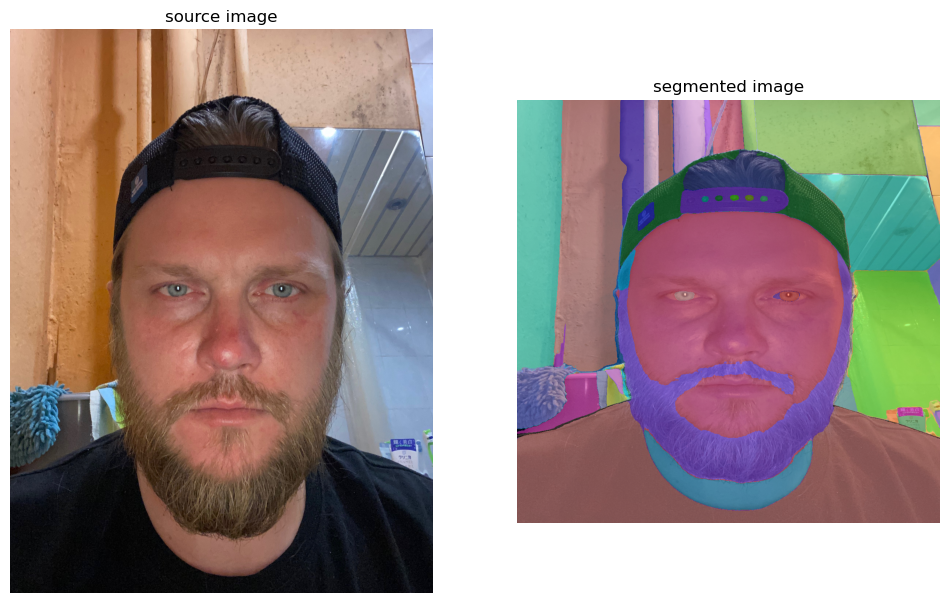

In [9]:
import supervision as sv  # Importa a biblioteca supervision para anotação e visualização de imagens

# Cria uma instância de MaskAnnotator com uma tabela de cores baseada em índices
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

# Converte os resultados do modelo SAM para um objeto Detections
detections = sv.Detections.from_sam(sam_result=sam_result)

# Anota a imagem RGB copiada com as detecções obtidas
annotated_image = mask_annotator.annotate(scene=image_rgb.copy(), detections=detections)

# Plota a imagem original e a imagem anotada numa grelha
sv.plot_images_grid(
    images=[image_bgr, annotated_image],  # Lista de imagens a serem exibidas
    grid_size=(1, 2),  # Configuração do tamanho da grelha
    titles=['source image', 'segmented image']  # Títulos para cada imagem na grelha
)

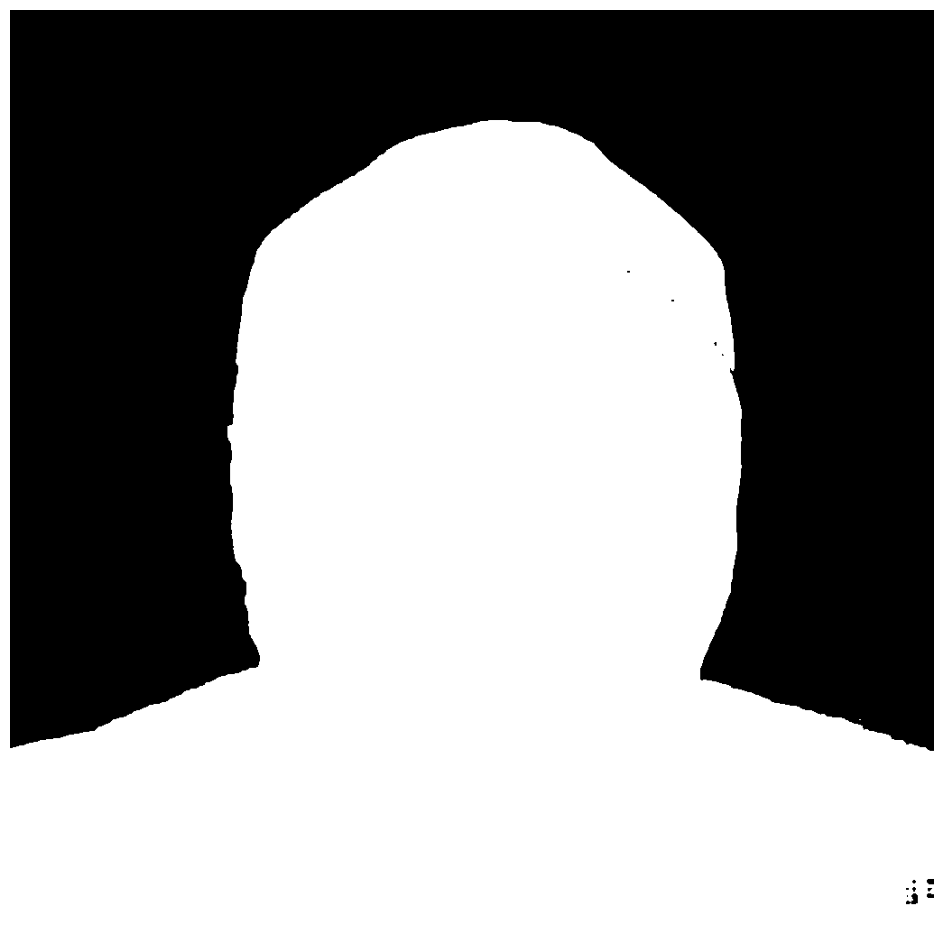

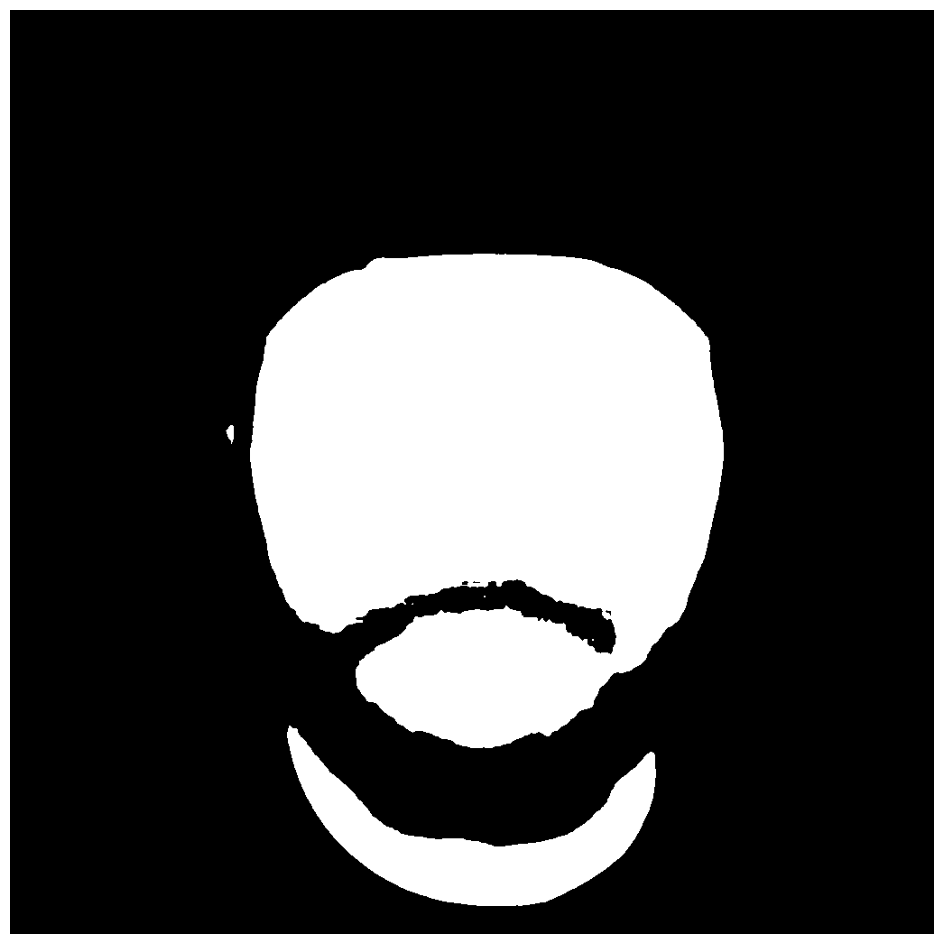

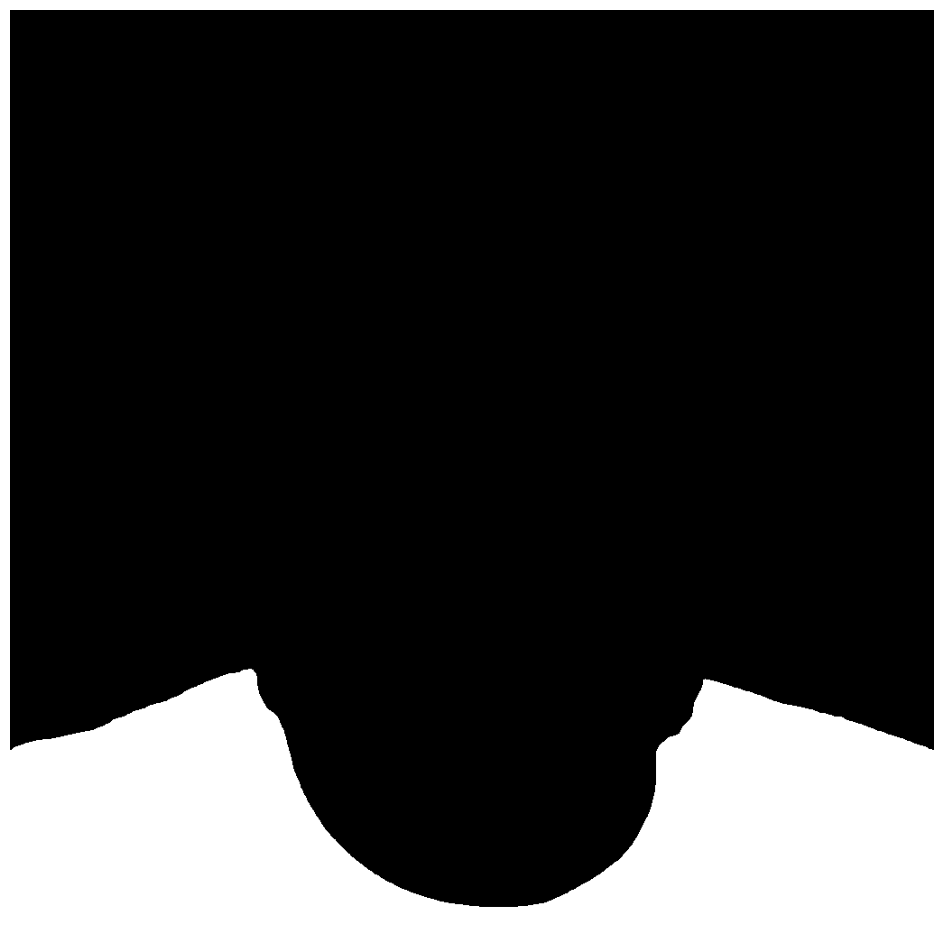

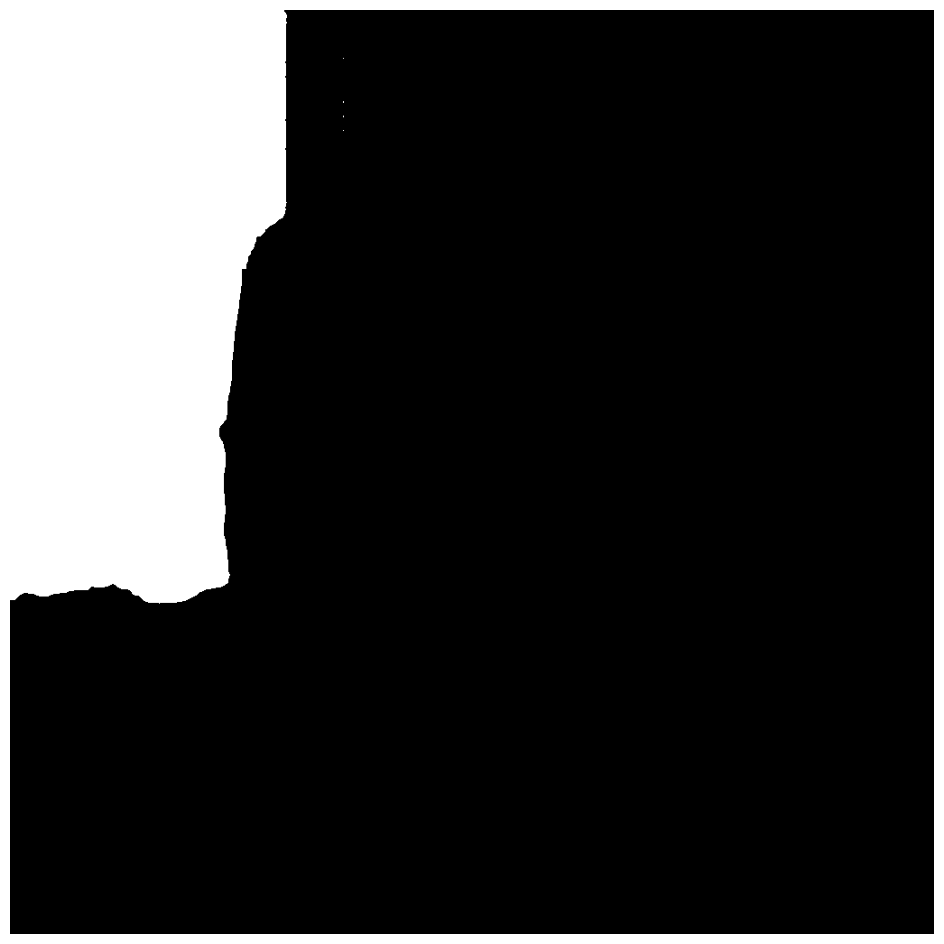

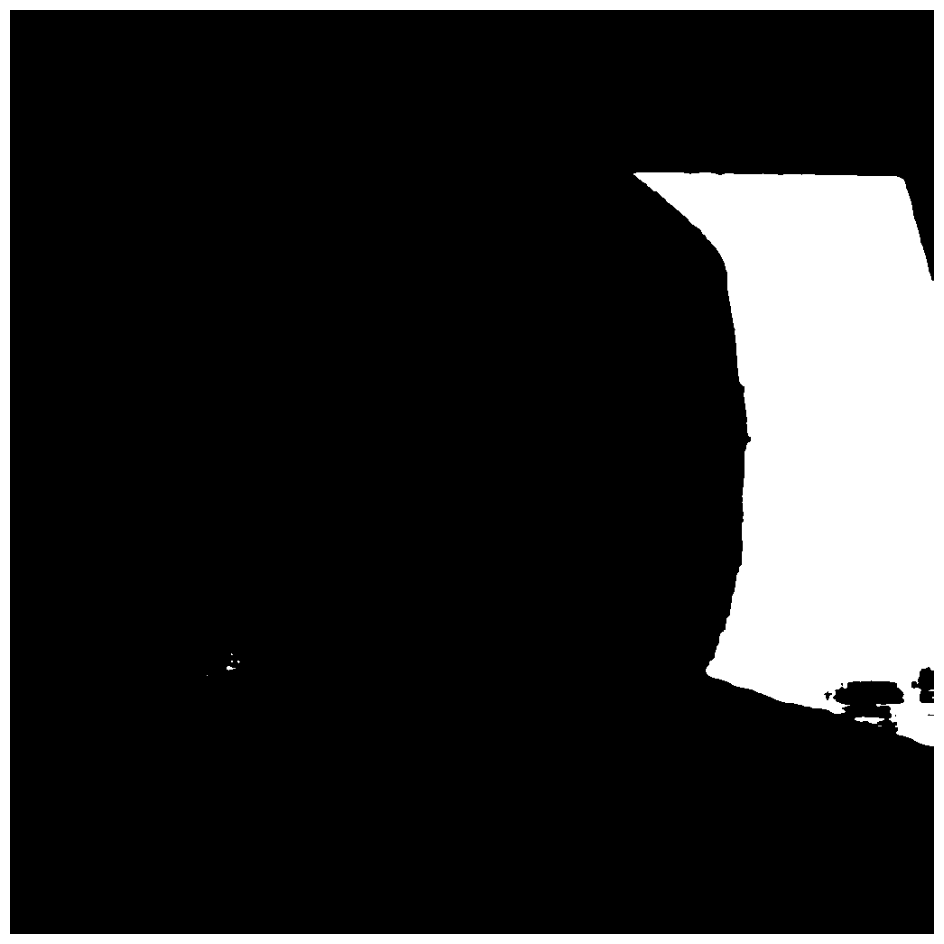

...

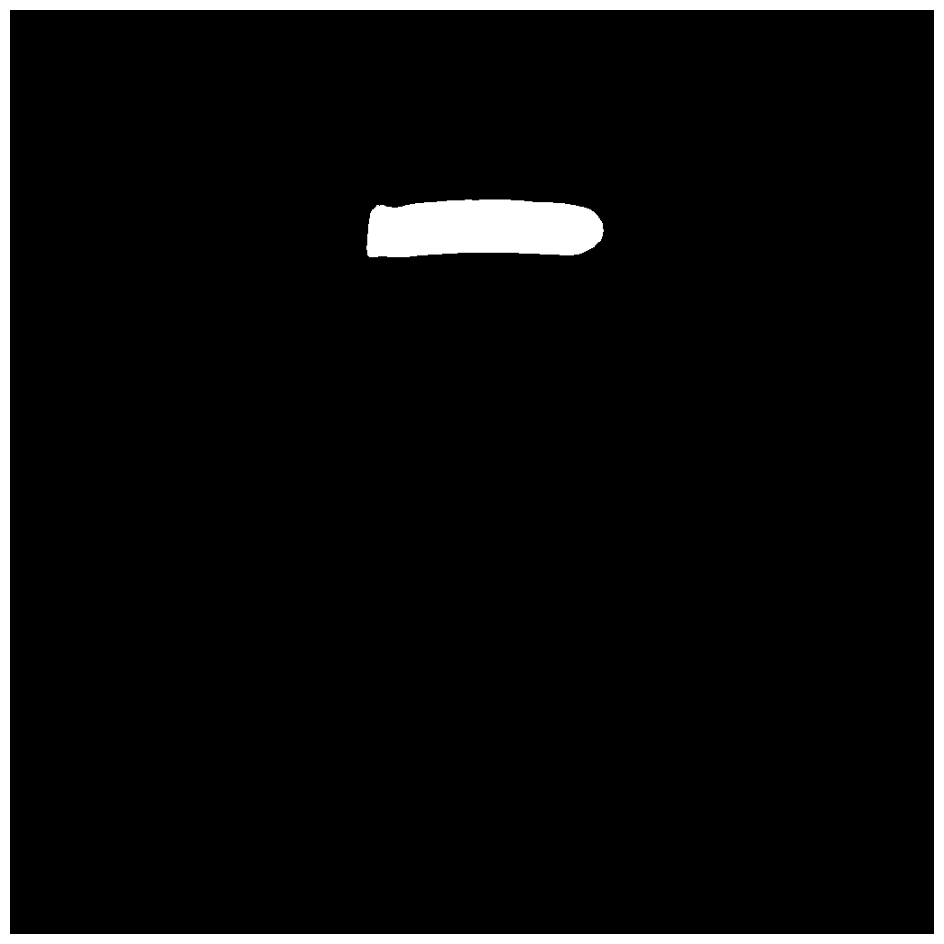

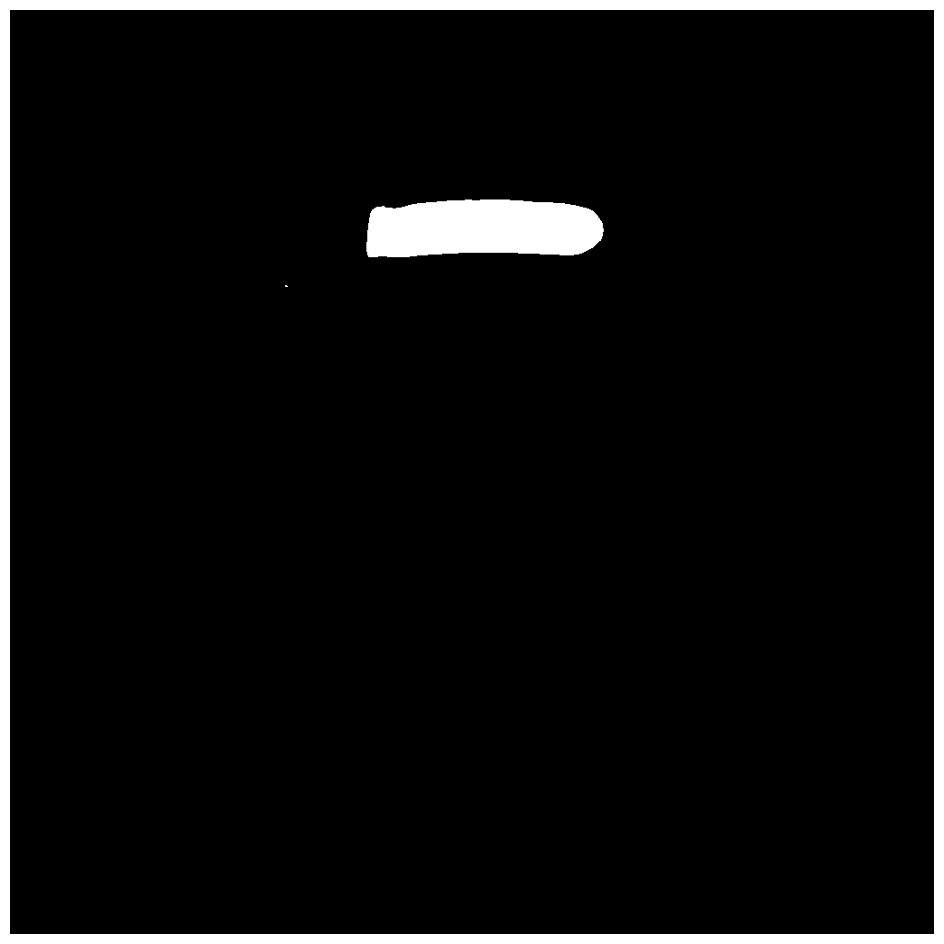

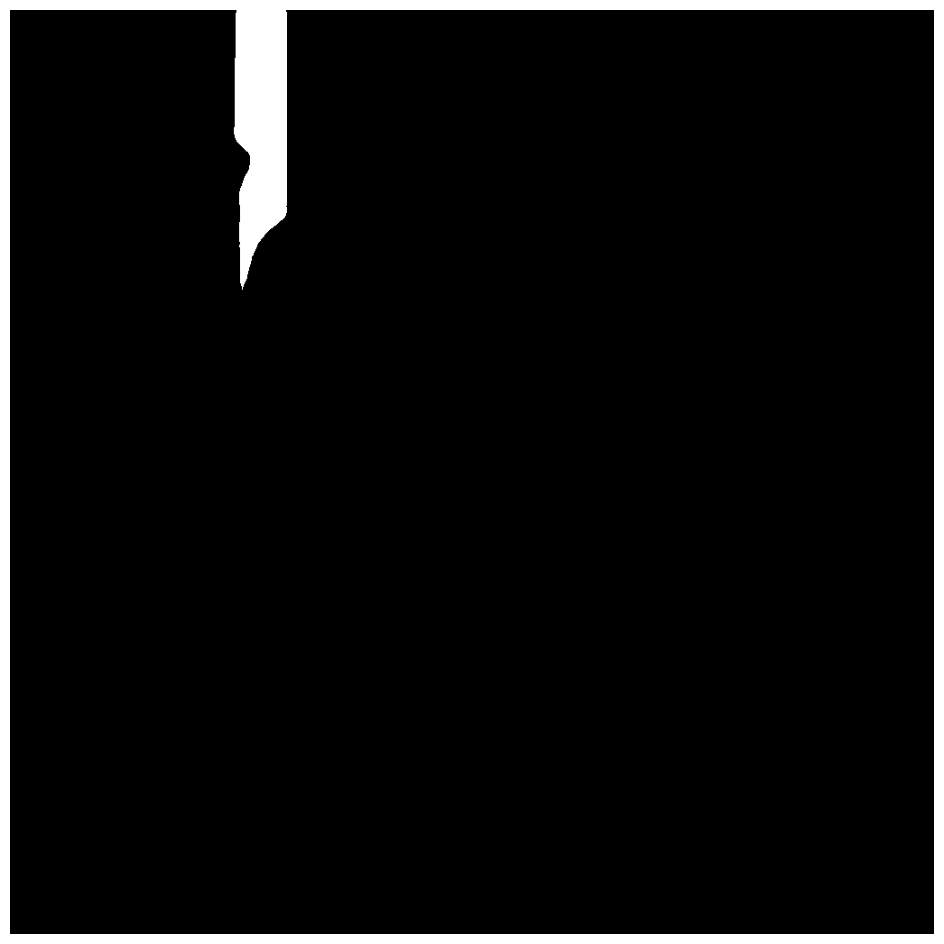

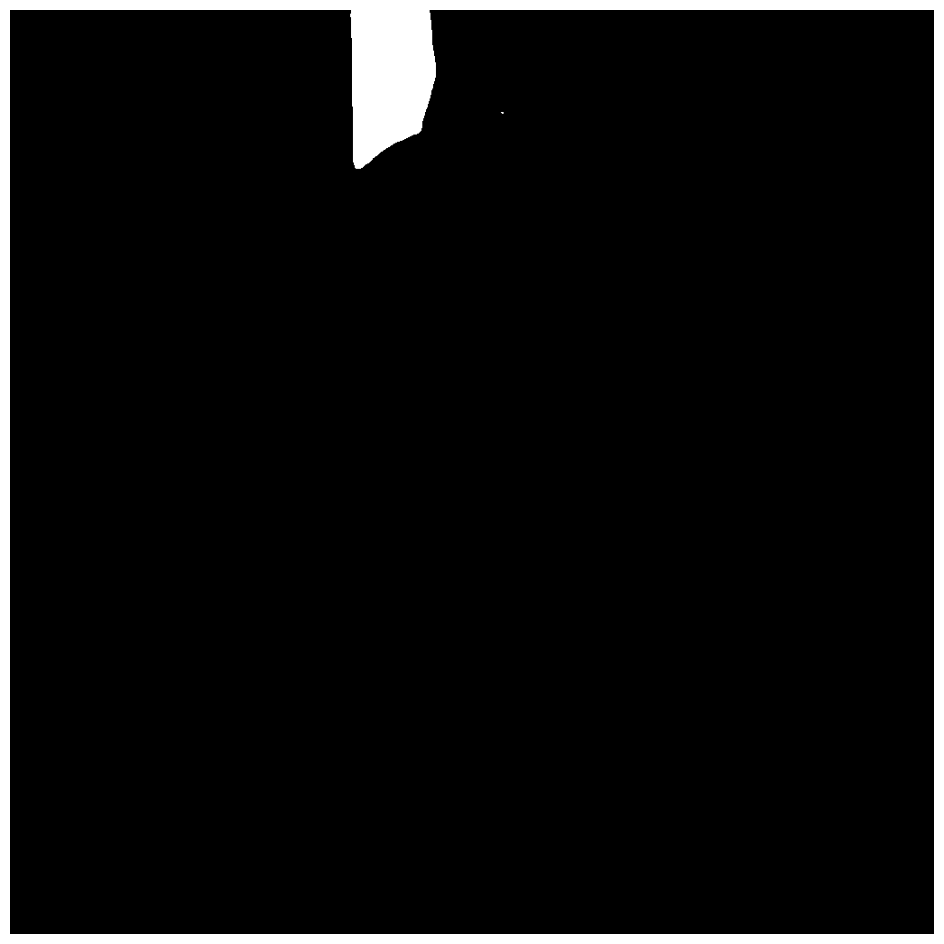

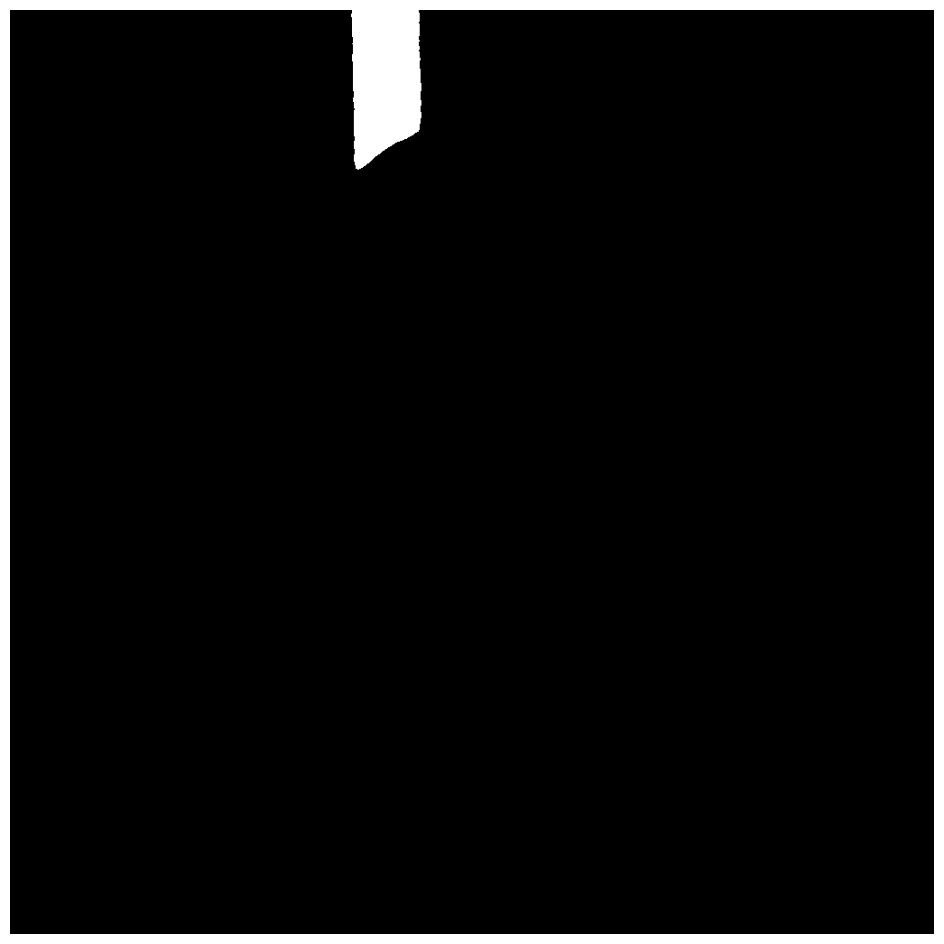

In [10]:
# Cria uma lista de máscaras de segmentação, ordenando os resultados por área, do maior para o menor
masks = [
    mask['segmentation']  # Extrai a máscara de segmentação de cada resultado
    for mask in sorted(sam_result, key=lambda x: x['area'], reverse=True)  # Ordena os resultados pela área, em ordem decrescente
]

# Itera sobre as primeiras 20 máscaras da lista
for i in range(20):
    sv.plot_image(masks[i])  # Plota cada máscara usando a função plot_image da biblioteca supervision

Processing Images:   0%|          | 0/13 [00:00<?, ?it/s]

image_rgb.shape (1024, 1024, 3)


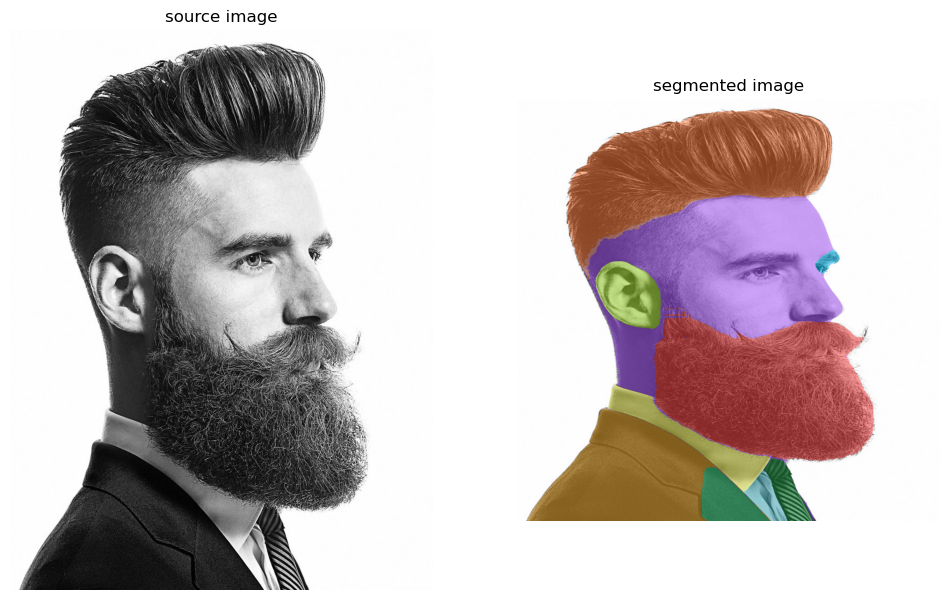

Processing Images:   8%|▊         | 1/13 [01:11<14:21, 71.75s/it]

image_rgb.shape (1024, 1024, 3)


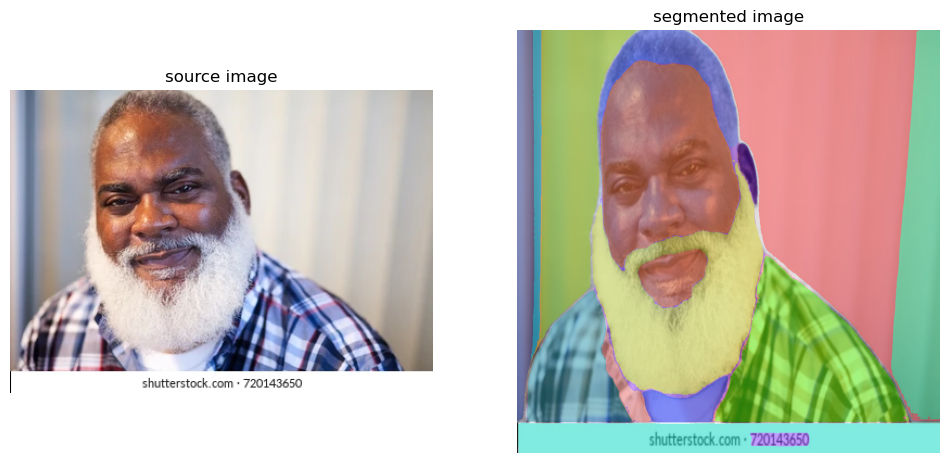

Processing Images:  15%|█▌        | 2/13 [02:32<14:08, 77.17s/it]

image_rgb.shape (1024, 1024, 3)


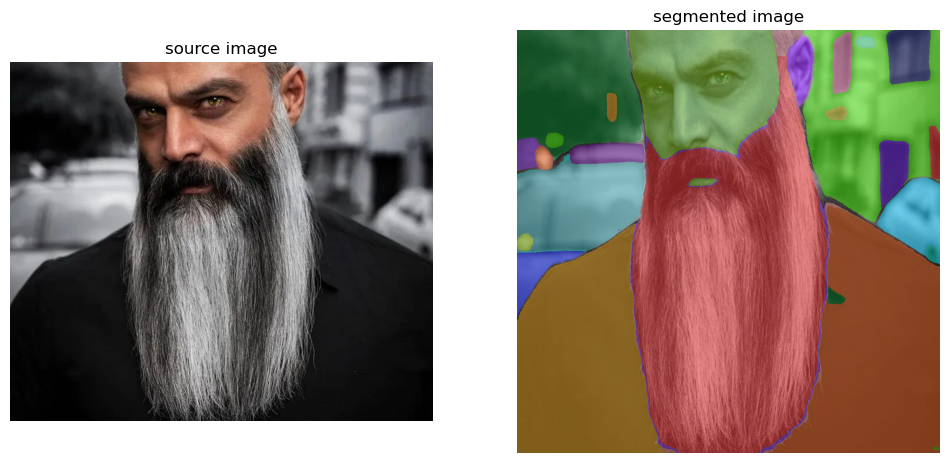

Processing Images:  23%|██▎       | 3/13 [03:40<12:09, 72.91s/it]

image_rgb.shape (1024, 1024, 3)


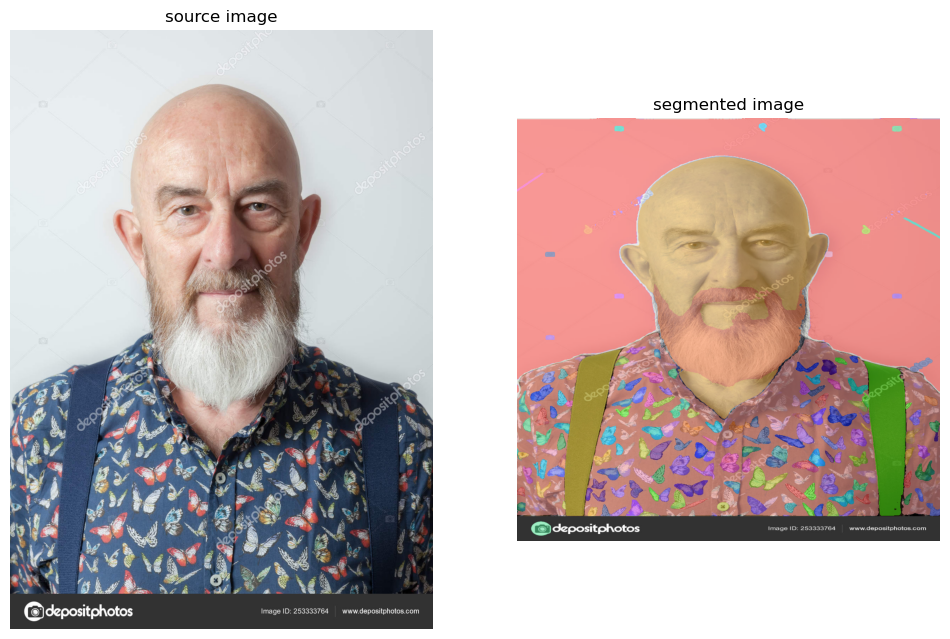

Processing Images:  31%|███       | 4/13 [04:44<10:25, 69.45s/it]

image_rgb.shape (1024, 1024, 3)


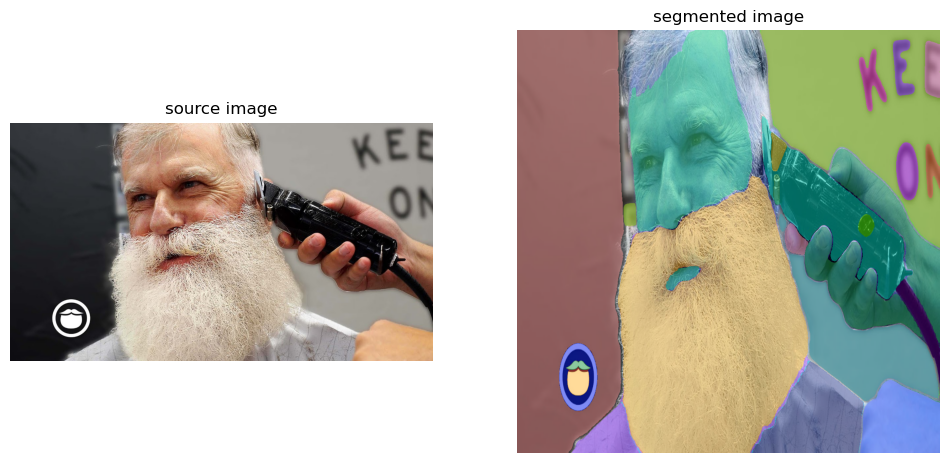

Processing Images:  38%|███▊      | 5/13 [05:50<09:04, 68.07s/it]

image_rgb.shape (1024, 1024, 3)


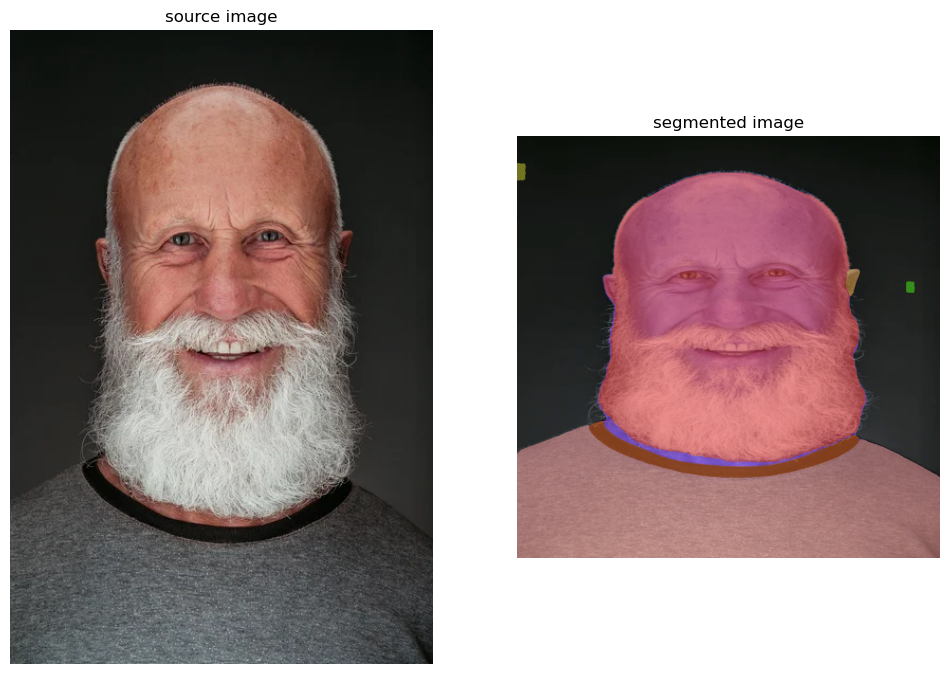

Processing Images:  46%|████▌     | 6/13 [06:58<07:57, 68.26s/it]

image_rgb.shape (1024, 1024, 3)


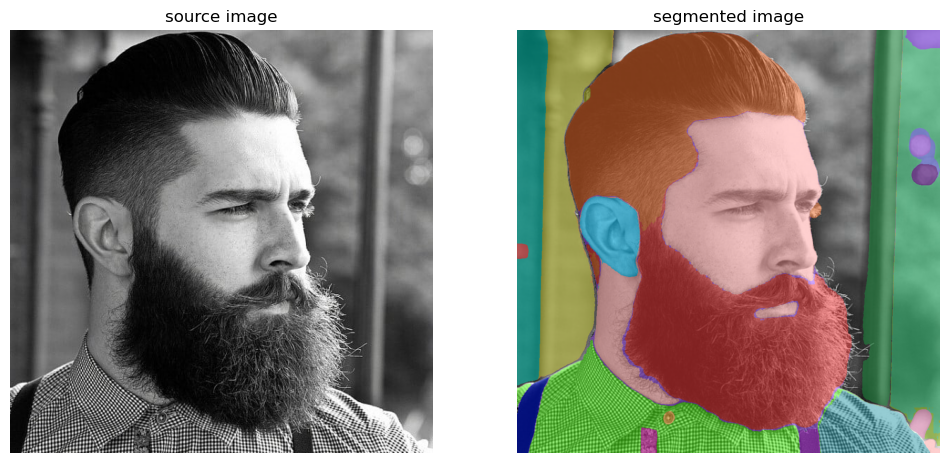

Processing Images:  54%|█████▍    | 7/13 [08:16<07:07, 71.17s/it]

image_rgb.shape (1024, 1024, 3)


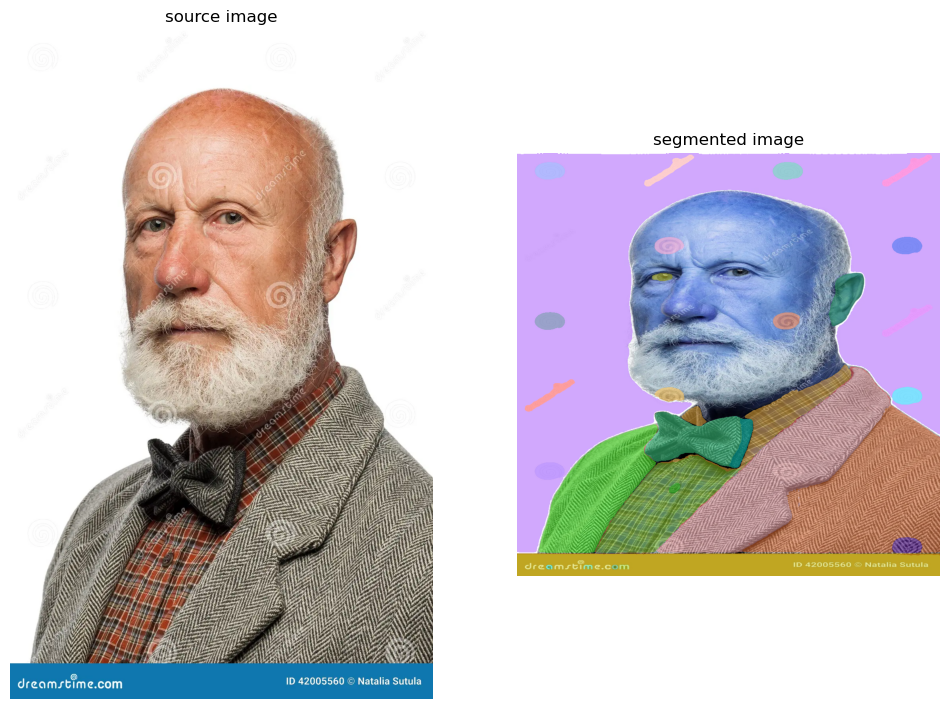

Processing Images:  62%|██████▏   | 8/13 [09:23<05:49, 69.85s/it]

image_rgb.shape (1024, 1024, 3)


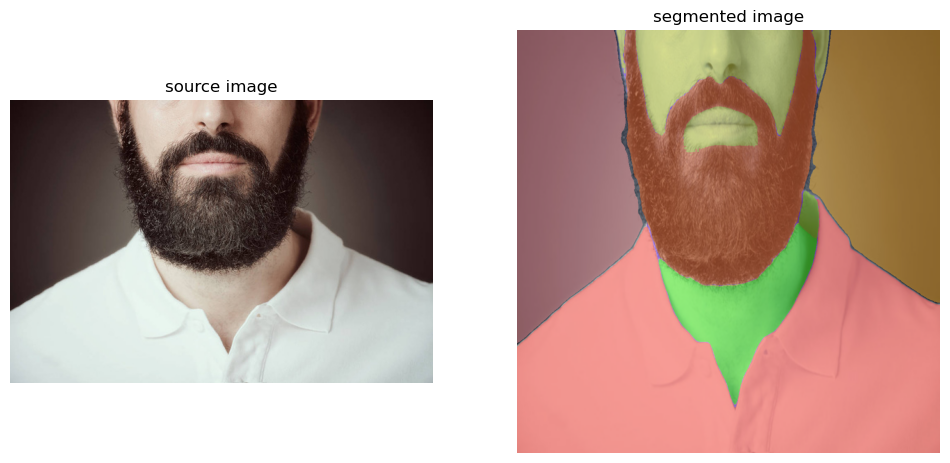

Processing Images:  69%|██████▉   | 9/13 [10:34<04:41, 70.28s/it]

image_rgb.shape (1024, 1024, 3)


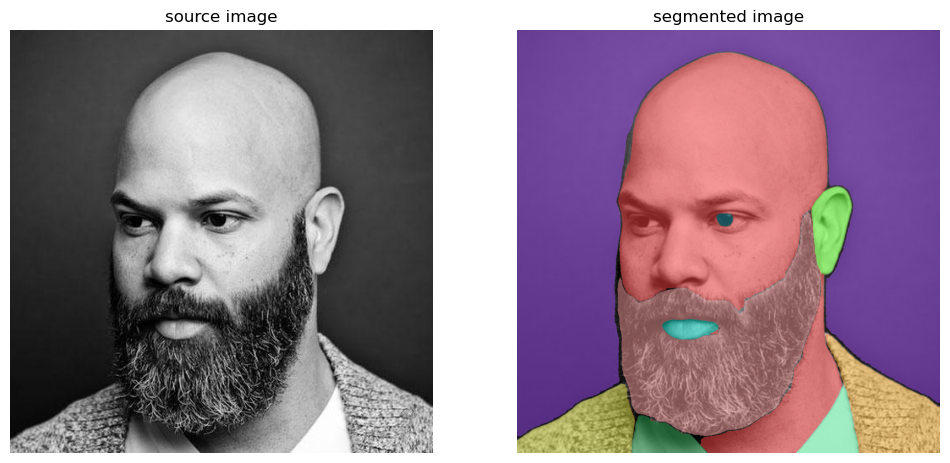

Processing Images:  77%|███████▋  | 10/13 [11:44<03:31, 70.38s/it]

image_rgb.shape (1024, 1024, 3)


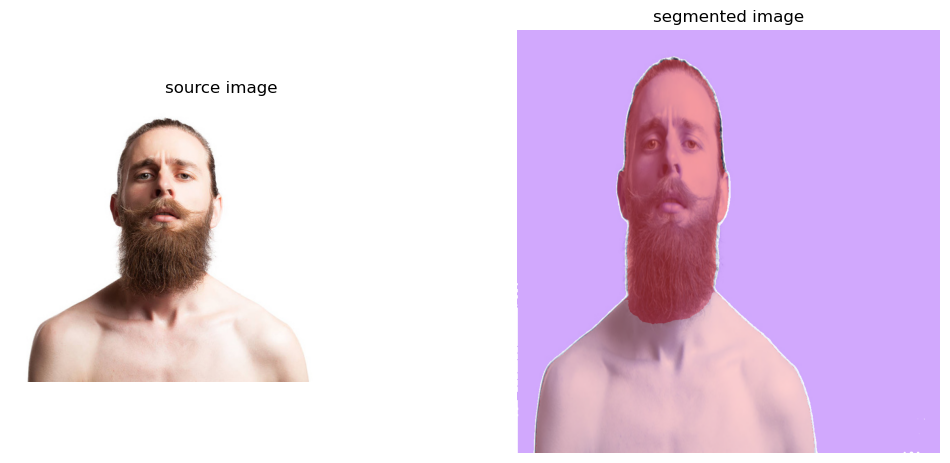

Processing Images:  85%|████████▍ | 11/13 [12:52<02:19, 69.55s/it]

image_rgb.shape (1024, 1024, 3)


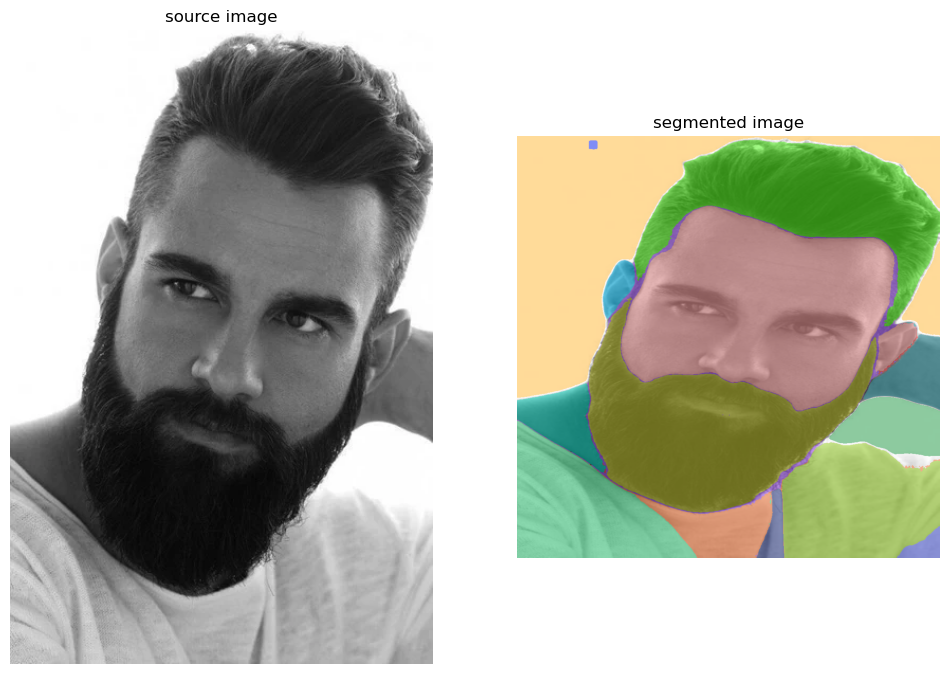

Processing Images:  92%|█████████▏| 12/13 [14:04<01:10, 70.12s/it]

image_rgb.shape (1024, 1024, 3)


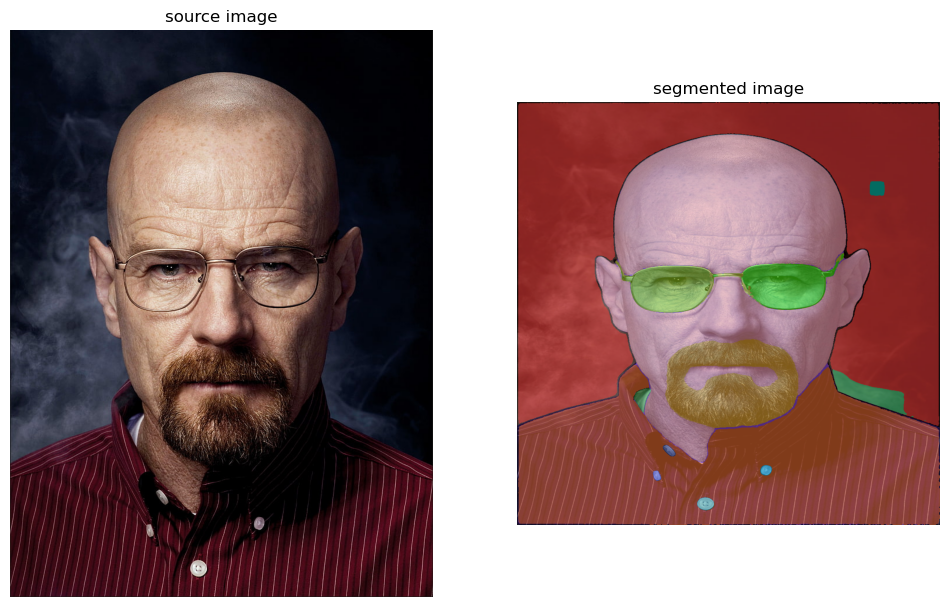

Processing Images: 100%|██████████| 13/13 [15:12<00:00, 70.19s/it]


In [11]:
from tqdm import tqdm  # Importa o módulo tqdm para visualizar barras de progresso
import numpy as np  # Importa a biblioteca numpy para operações matemáticas e manipulação de arrays

# Define o diretório que contém as imagens e o diretório de saída
image_dir = os.path.join(HOME, "teste")
output_dir = os.path.join(HOME, "output")

# Cria o diretório de saída se ele não existir
os.makedirs(output_dir, exist_ok=True)

# Obtém uma lista de todos os ficheiros de imagem no diretório especificado
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.webp'))]

# Itera sobre os ficheiros de imagem
for image_file in tqdm(image_files, desc="Processing Images"):
    image_path = os.path.join(image_dir, image_file)  # Caminho completo da imagem
    image_bgr = cv2.imread(image_path)  # Lê a imagem em formato BGR
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)  # Converte de BGR para RGB
    image_rgb = cv2.resize(image_rgb, (1024, 1024))  # Redimensiona a imagem para 1024x1024 pixels

    # Imprime as dimensões da imagem para verificação
    print("image_rgb.shape", image_rgb.shape)

    # Gera uma máscara para a imagem usando o gerador de máscaras
    sam_result = mask_generator.generate(image_rgb)

    # Anota a imagem com as detecções obtidas
    mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)
    detections = sv.Detections.from_sam(sam_result=sam_result)
    annotated_image = mask_annotator.annotate(scene=image_rgb.copy(), detections=detections)

    # Plota a imagem original e a imagem anotada
    sv.plot_images_grid(
        images=[image_bgr, annotated_image],
        grid_size=(1, 2),
        titles=['source image', 'segmented image']
    )

    # Cria um diretório para cada imagem para guardar as máscaras
    image_output_dir = os.path.join(output_dir, os.path.splitext(image_file)[0])
    os.makedirs(image_output_dir, exist_ok=True)

    # Guarda as máscaras
    masks = [
        mask['segmentation']  # Extrai as máscaras de segmentação
        for mask in sorted(sam_result, key=lambda x: x['area'], reverse=True)  # Ordena as máscaras por área
    ]

    # Salva cada máscara como uma imagem PNG
    for i, mask in enumerate(masks):
        output_path = os.path.join(image_output_dir, f"mask_{i}.png")
        cv2.imwrite(output_path, (mask * 255).astype(np.uint8))

# Segunda Abordagem

### Foram feitas 3 implementações diferentes com datasetes diferentes que essencialmente fazem a mesma coisa. Na ultima célula foi feito o loop que fará a segmentação do diretório completo

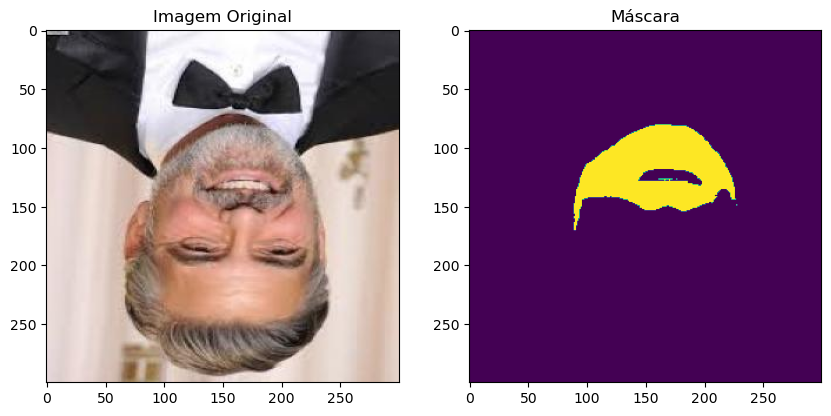

In [12]:
# Importar as bibliotecas necessárias
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import cv2

# Definição do nome e do caminho da imagem
IMAGE_NAME = "beard_boxes/train/images--0-_jpg.rf.05dcb5c519e2df59cd5999a86d32d1b2.jpg"
IMAGE_PATH = os.path.join(HOME, IMAGE_NAME)

# Verificar se a imagem existe no caminho especificado, se não, lançar um erro
assert os.path.isfile(IMAGE_PATH), f"Imagem não encontrada: {IMAGE_PATH}"

# Ler o ficheiro CSV que contém as anotações das caixas
boxes_csv = pd.read_csv(os.path.join(HOME, "beard_boxes/train/_annotations.csv"))

# Filtrar as anotações para obter apenas as informações da imagem especificada
boxes_csv = boxes_csv[boxes_csv["filename"] == "images--0-_jpg.rf.05dcb5c519e2df59cd5999a86d32d1b2.jpg"]

# Criar um array numpy com as coordenadas das caixas de delimitação
box = np.array([
    boxes_csv['xmin'],
    boxes_csv['ymin'],
    boxes_csv['xmax'],
    boxes_csv['ymax']
])

# Ler a imagem usando OpenCV
image_bgr = cv2.imread(IMAGE_PATH)
# Converter a imagem de BGR para RGB
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Instanciar o preditor de máscaras
mask_predictor = SamPredictor(sam)
# Definir a imagem no preditor
mask_predictor.set_image(image_rgb)

# Prever a máscara usando a caixa de delimitação
masks, scores, logits = mask_predictor.predict(
    box=box,
    multimask_output=False
)

# Criar uma figura para mostrar as imagens
plt.figure(figsize=(10, 5))  # Ajustar o tamanho conforme necessário

# Mostrar a imagem original
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Imagem Original')

# Mostrar a máscara
plt.subplot(1, 2, 2)
plt.imshow(masks[0])
plt.title('Máscara')

# Exibir as imagens
plt.show()

SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


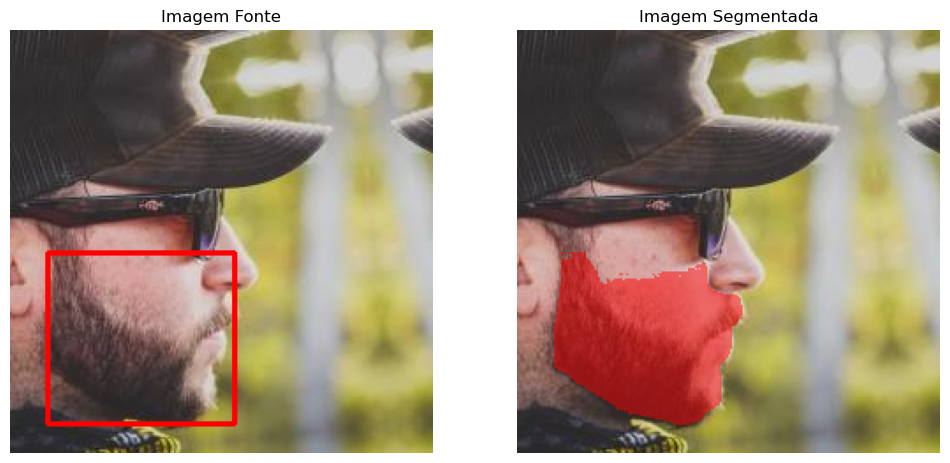

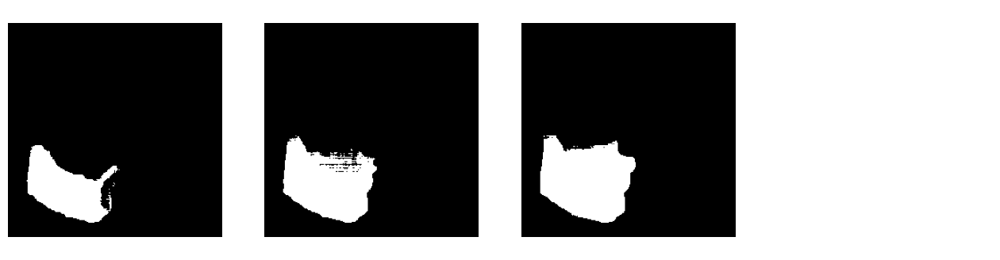

In [13]:
import cv2
from matplotlib import pyplot as plt
import supervision as sv
import numpy as np
import pandas as pd
import os

# Carregar dados de um CSV contendo anotações de imagens
boxes_csv = pd.read_csv(os.path.join(HOME, "beard_boxes_test/train/_annotations.csv"))
# Filtrar para manter apenas as anotações de classe "beard"
boxes_csv = boxes_csv[boxes_csv["class"] == "beard"]

# Ordenar os dados pelo nome do ficheiro
boxes_csv = boxes_csv.sort_values(by=['filename'])

# Selecionar o nome da imagem
IMAGE_NAME = 'beard_boxes_test/train/'+boxes_csv["filename"].values[4]
# Construir o caminho completo para a imagem
IMAGE_PATH = os.path.join(HOME, IMAGE_NAME)

# Verificar se a imagem existe; caso contrário, emitir um erro
assert os.path.isfile(IMAGE_PATH), f"Image not found: {IMAGE_PATH}"

# Extrair as coordenadas da caixa delimitadora para a quinta imagem
box = np.array([
    boxes_csv['xmin'].values[4],
    boxes_csv['ymin'].values[4],
    boxes_csv['xmax'].values[4],
    boxes_csv['ymax'].values[4]
])

# Ler a imagem e converter de BGR (OpenCV) para RGB (matplotlib)
image_bgr = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Inicializar o preditor de máscaras com o modelo 'sam'
mask_predictor = SamPredictor(sam)
mask_predictor.set_image(image_rgb)

# Prever máscaras usando a caixa delimitadora
masks, scores, logits = mask_predictor.predict(
    box=box,
    multimask_output=True
)

# Anotar a imagem com caixas delimitadoras e máscaras
box_annotator = sv.BoxAnnotator(color=sv.Color.red())
mask_annotator = sv.MaskAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)

# Criar detecções a partir das máscaras
detections = sv.Detections(
    xyxy=sv.mask_to_xyxy(masks=masks),
    mask=masks
)
# Filtrar para manter apenas a detecção com a maior área
detections = detections[detections.area == np.max(detections.area)]

# Anotar a imagem original com as caixas delimitadoras
source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
# Anotar a imagem original com as máscaras
segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

# Exibir as imagens anotadas em grade
sv.plot_images_grid(
    images=[source_image, segmented_image],
    grid_size=(1, 2),
    titles=['Imagem Fonte', 'Imagem Segmentada']
)

# Exibir as máscaras em grade
sv.plot_images_grid(
    images=masks,
    grid_size=(1, 4),
    size=(16, 4)
)

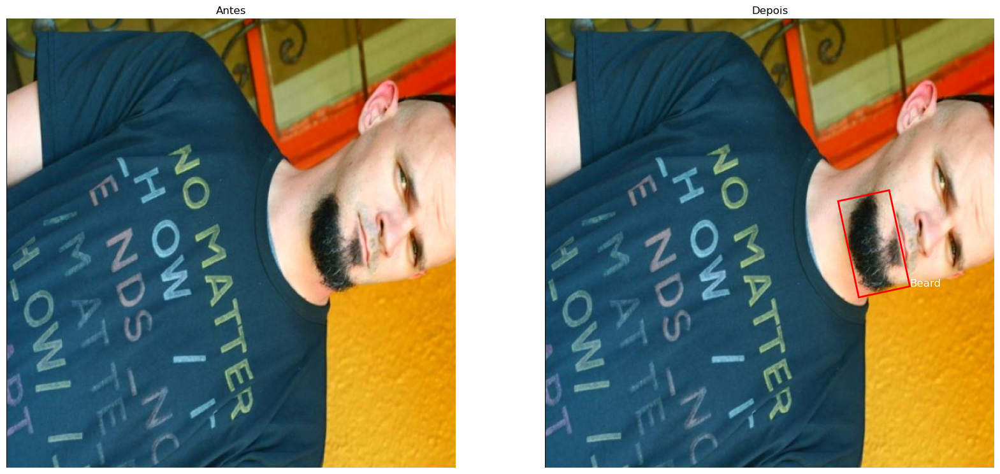

SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


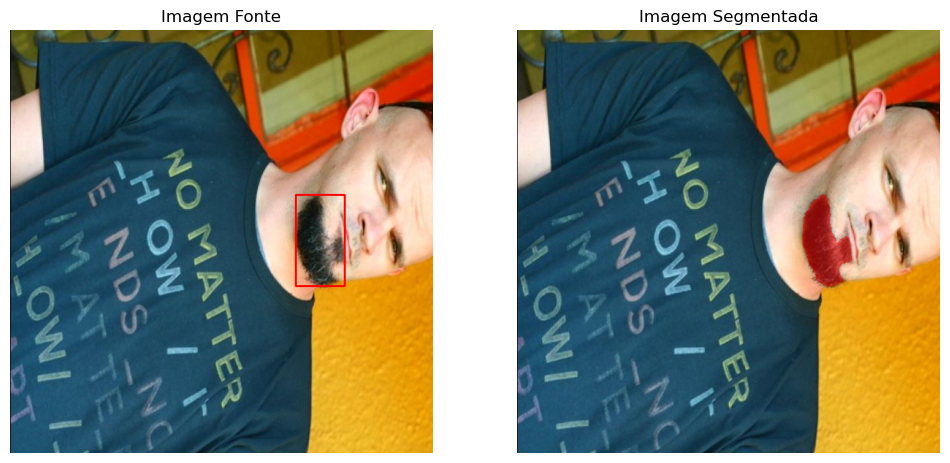

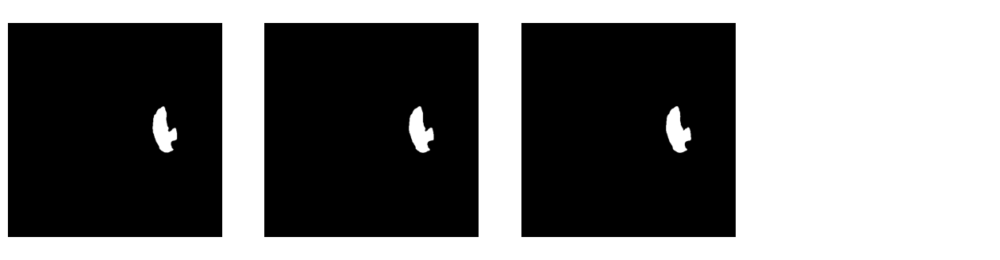

In [70]:
import os
import json
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import cv2

# Definição dos caminhos
beard_segmented_dir = os.path.join(HOME, 'beard_segmented')
train_dir = os.path.join(beard_segmented_dir, 'train')
images_dir = os.path.join(train_dir, 'images')
labels_dir = os.path.join(train_dir, 'label')

# Listagem e filtragem dos arquivos de imagem
image_files = [file for file in os.listdir(images_dir) if file.endswith('.jpg')]

# Seleção aleatória de um arquivo de imagem
random_image_file = random.choice(image_files)
random_annotation_file = random_image_file.replace('.jpg', '.txt')

# Caminhos completos para a imagem e anotação
image_path = os.path.join(images_dir, random_image_file)
annotation_path = os.path.join(labels_dir, random_annotation_file)

# Carregamento da imagem
image = Image.open(image_path).convert('RGB')

# Carregamento e processamento da anotação
with open(annotation_path, 'r') as file:
    annotations = file.read().strip().split()[:-2]
float_annotations = [float(item) for item in annotations]
vertices_array = np.array(float_annotations).reshape(-1, 2)

# Plotagem da imagem antes e depois da anotação
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(image)
ax[0].set_title('Antes')
ax[0].axis('off')

ax[1].imshow(image)
polygon = patches.Polygon(vertices_array, closed=True, edgecolor='r', fill=None, linewidth=2)
ax[1].add_patch(polygon)
ax[1].text(vertices_array[0][0], vertices_array[0][1], 'Beard', color='white', fontsize=12)
ax[1].set_title('Depois')
ax[1].axis('off')
plt.show()

# Calculo da caixa delimitadora a partir dos vértices
xmin, ymin = np.min(vertices_array, axis=0)
xmax, ymax = np.max(vertices_array, axis=0)
box = np.array([xmin, ymin, xmax, ymax])

# Carregamento da imagem em BGR para processamento de visão computacional
image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Inicialização do preditor de máscaras e predição
mask_predictor = SamPredictor(sam)  # 'SamPredictor' e 'sam' são placeholders
mask_predictor.set_image(image_rgb)
masks, scores, logits = mask_predictor.predict(box=box, multimask_output=True)

# Anotação da imagem com caixas delimitadoras e máscaras
box_annotator = sv.BoxAnnotator(color=sv.Color.red())
mask_annotator = sv.MaskAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)
detections = sv.Detections(xyxy=sv.mask_to_xyxy(masks=masks), mask=masks)
detections = detections[detections.area == np.max(detections.area)]

source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

# Exibição das imagens anotadas em grade
sv.plot_images_grid(images=[source_image, segmented_image], grid_size=(1, 2), titles=['Imagem Fonte', 'Imagem Segmentada'])

# Exibição das máscaras em grade
sv.plot_images_grid(images=masks, grid_size=(1, 4), size=(16, 4))

In [18]:
import cv2
from matplotlib import pyplot as plt
import supervision as sv
import numpy as np
import pandas as pd
import os
from tqdm import tqdm  # Import tqdm for progress bar functionality

# Assuming HOME is defined

# Load data from a CSV containing image annotations
boxes_csv = pd.read_csv(os.path.join(HOME, "beard_boxes_test/train/_annotations.csv"))
# Filter to keep only the class "beard" annotations
boxes_csv = boxes_csv[boxes_csv["class"] == "beard"]

#shuffling the data
boxes_csv = boxes_csv.sample(frac=1).reset_index(drop=True)

# Only 2 rows
boxes_csv = boxes_csv.head(10)

# Sort the data by filename
boxes_csv = boxes_csv.sort_values(by=['filename'])

# Create output directory if it does not exist
output_dir = os.path.join(HOME, 'output_2nd')
os.makedirs(output_dir, exist_ok=True)

# Use tqdm to track the progress of the loop processing the images
for index, row in tqdm(boxes_csv.iterrows(), total=boxes_csv.shape[0], desc="Processing Images"):
    # Build the full path to the image
    image_path = os.path.join(HOME, 'beard_boxes_test/train', row['filename'])

    # Check if the image exists; if not, skip to the next
    if not os.path.isfile(image_path):
        print(f"Image not found: {image_path}")
        continue

    # Extract the bounding box coordinates
    box = np.array([row['xmin'], row['ymin'], row['xmax'], row['ymax']])

    # Read the image and convert from BGR (OpenCV) to RGB (matplotlib)
    image_bgr = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # Initialize the mask predictor with the model 'sam'
    mask_predictor = SamPredictor(sam)
    mask_predictor.set_image(image_rgb)

    # Predict masks using the bounding box
    masks, scores, logits = mask_predictor.predict(box=box, multimask_output=True)

    # Annotate the image with bounding boxes and masks
    box_annotator = sv.BoxAnnotator(color=sv.Color.red())
    mask_annotator = sv.MaskAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)

    # Create detections from the masks
    detections = sv.Detections(xyxy=sv.mask_to_xyxy(masks=masks), mask=masks)
    # Keep only the detection with the largest area
    detections = detections[detections.area == np.max(detections.area)]

    # Annotate the original image with the bounding boxes
    source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
    # Annotate the original image with the masks
    segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

    # Save annotated images
    cv2.imwrite(os.path.join(output_dir, f'{index}_source.jpg'), cv2.cvtColor(source_image, cv2.COLOR_RGB2BGR))
    cv2.imwrite(os.path.join(output_dir, f'{index}_segmented.jpg'), cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR))

print("Processing complete. Results are saved in", output_dir)

Processing Images:   0%|          | 0/10 [00:00<?, ?it/s]SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
Processing Images:  10%|█         | 1/10 [00:26<03:54, 26.07s/it]SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `

Processing complete. Results are saved in /Users/nuno/programação/aprendizagem_visao/output_2nd
